# Train DiT using ImageNet

This notebook follows **ImageNet** section from [Training a Latent Diffusion Model From Scratch](https://medium.com/@geronimo7/training-a-latent-diffusion-model-from-scratch-897c7b77ece9).

To train on this dataset, Geronimo **generated captions** for these images using Visual Language Models (VLMs):
1. **moondream2** Moondream is a small vision language model.
2. **smolvlm2 (text_encoder)** SmolVLM2-2.2B is a lightweight multimodal model designed to analyze video content. The model processes videos, images, and text inputs to generate text outputs.
3. **qwen2.5 VL**  Qwen2-VL vision-language models.
   
and converted them to latents using the Deep Compression Autoencoder.

The blog described training the transofmer model with **116M param** from scratch took 42 hours on a NVIDIA RTX PRO 6000. 
This would cost ~$81 on RunPod for example.


## Model Parameter Estimate

**Model Configuration**

```
config["num_layers"] = 12
config["num_attention_heads"] = 12
config["attention_head_dim"] = 64
config["cross_attention_dim"] = 768
config["num_cross_attention_heads"] = 12
config["cross_attention_head_dim"] = 64
config["caption_channels"] = 960
```

* Assumptions
    * hidden_size = num_attention_heads * attention_head_dim = 12 * 64 = 768
    * FFN inner dim = 4 * hidden_size = 3072 (typical; Sana likely uses a similar factor)
    * We count weight matrices only (biases and layernorm params add a small amount)
  
* Number of params per transformer block (one layer)
    * Self-attention:
        * Q,K,V projections: 3 × (hidden × hidden) = 3 × (768 × 768) = 1,769,472
        * Output projection: hidden × hidden = 768 × 768 = 589,824
        * Self-attn total ≈ 2,359,296
    * Cross-attention (similar size to self-attn) ≈ 2,359,296
    * Feed-forward network (FFN):
        * Up projection: hidden × ffn = 768 × 3072 = 2,359,296
        * Down projection: ffn × hidden = 3072 × 768 = 2,359,296
        * FFN total ≈ 4,718,592
    * Total per layer ≈ 2,359,296 + 2,359,296 + 4,718,592 = 9,437,184

* Across 12 layers: 9,437,184 × 12 = 113,246,208
* Embeddings, input/output projections, layernorms, bias terms, small heads, and other small modules typically add a few million parameters. For example ~2–4M extra will bring the total to about 115–117M.

* 113.25M (core transformer blocks) + ~2.75M (overhead) ≈ 116M total parameters.

In [1]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import torch
import torch.nn.functional as F

from datasets import load_dataset
from diffusers import SanaTransformer2DModel, AutoencoderDC
from transformers import AutoModel, AutoTokenizer, GemmaTokenizerFast
from torchvision.utils import make_grid
from torchvision import transforms
import torchvision.transforms as T

# Train with reduced precision 
dtype = torch.bfloat16
# CUDA device highly recommended
device = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"

print(f"device: {device}")

/home/colligo/transformer/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device: cuda


In [13]:
from tqdm import tqdm

# largest edge 256px
def resize_max_dim(image, dim=256):
    return T.Resize(dim, antialias=True)(image)

# DC-AE needs image dimensions to be multiple of 32
def resize_closest_multiple(image, denom=32):
    w, h = image.size
    w = round(w / denom) * denom
    h = round(h / denom) * denom
    return image.resize((w, h))

## ImageNet Data

In [8]:
ds = load_dataset(
    "visual-layer/imagenet-1k-vl-enriched", 
    cache_dir="/mnt/localssd/ssd-2TB/hf_cache",
    num_proc = 48,
)

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: 715e8bc4-586d-4035-806a-ee12553fcf4d)')' thrown while requesting HEAD https://huggingface.co/datasets/visual-layer/imagenet-1k-vl-enriched/resolve/ac6afcdeb3be31c5ff6a7ff579874b3d372b7074/data/train-00186-of-00207.parquet
Retrying in 1s [Retry 1/5].
Generating train split: 100%|█| 1281167/1281167 [02:22<00:00, 8971.68 examples/s
Setting num_proc from 48 to 8 for the validation split as it only contains 8 shards.
Generating validation split: 100%|█| 50000/50000 [00:01<00:00, 28086.13 examples


In [40]:
images = ds["train"][60:100]["image"]

### Original images

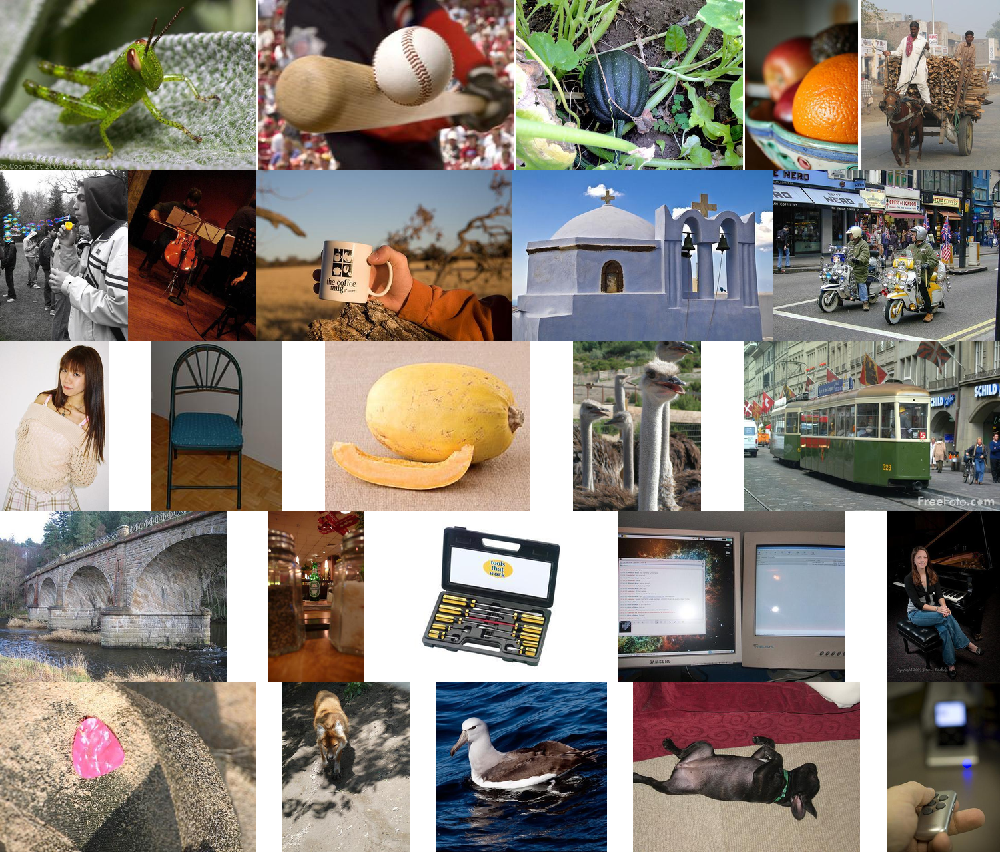

In [12]:
from utils import make_grid

grid=make_grid([
    i for i in images
], rows=5, cols=5, height=256)
grid

## DiT Model

In [2]:
# Load Sana 600M config
config = SanaTransformer2DModel.load_config(
    "Efficient-Large-Model/Sana_600M_1024px_diffusers", 
    subfolder="transformer"
)

# Reduce depth
config["num_layers"] = 12

# Reduce width
config["num_attention_heads"] = 12
config["attention_head_dim"] = 64
config["cross_attention_dim"] = 768
config["num_cross_attention_heads"] = 12
config["cross_attention_head_dim"] = 64

# Adapt to hidden size of SmolLM2
config["caption_channels"] = 960

transformer = SanaTransformer2DModel.from_config(config).to(dtype).to(device)

## Text Encoder and VAE

In [3]:
te_repo = "HuggingFaceTB/SmolLM2-360M"

# Load the text encoder and tokenizer
tokenizer = AutoTokenizer.from_pretrained(te_repo, torch_dtype=dtype)
# Pad token is not set by default, use eos
tokenizer.pad_token = tokenizer.eos_token
text_encoder = AutoModel.from_pretrained(te_repo, torch_dtype=dtype).to(device)

sana_repo = "Efficient-Large-Model/Sana_600M_1024px_diffusers"
# Load Deep Compression AutoEncoder
vae = AutoencoderDC.from_pretrained(sana_repo, subfolder="vae", torch_dtype=dtype).to(device)

## Visualize Latent images

100%|███████████████████████████████████████████| 40/40 [00:02<00:00, 17.09it/s]


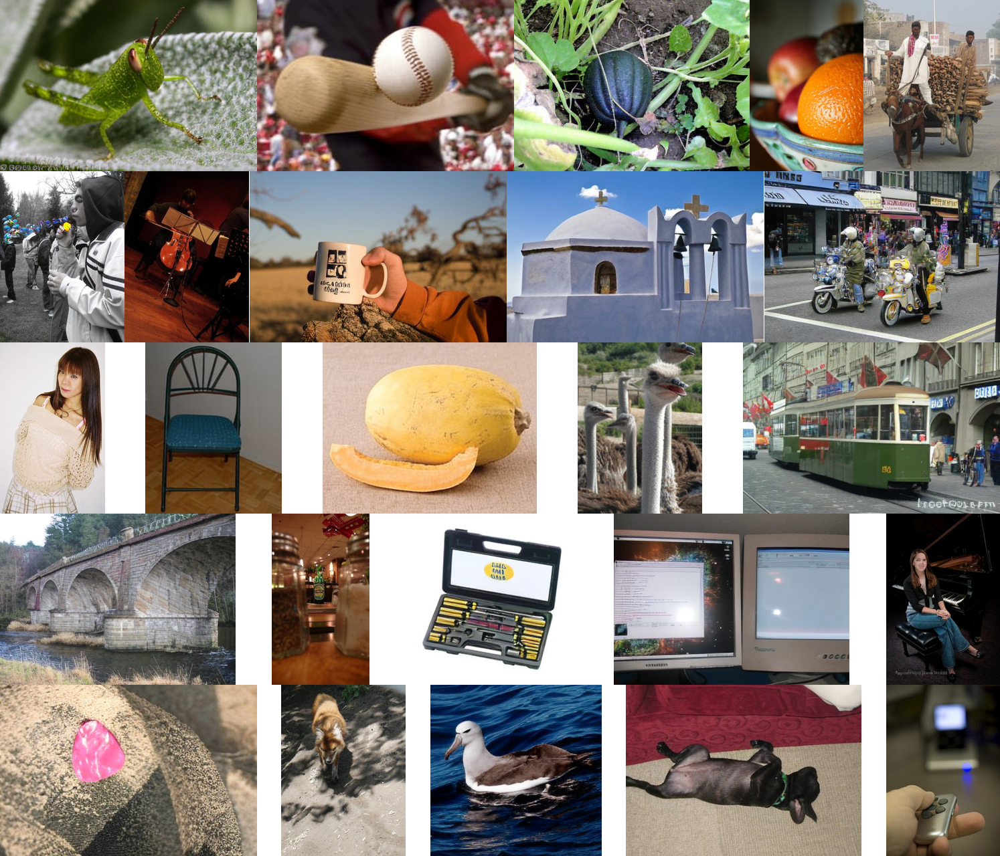

In [41]:
from utils import PIL_to_latent, latent_to_PIL

latent_imgs = []
for i in tqdm(range(40)):
    image = images[i]
    image = image.convert('RGB') if image.mode != "RGB" else image
    image = resize_max_dim(image)
    image = resize_closest_multiple(image)
    latent = PIL_to_latent(image, vae)
    latent_imgs.append(latent_to_PIL(latent, vae))

grid=make_grid([
    i for i in latent_imgs
], rows=5, cols=5, height=256)
grid

## Data Loader

In [21]:
from utils import load_IN1k256px_AR
dataloader_train, dataloader_eval = load_IN1k256px_AR(batch_size=256, label_dropout=0.1)

Generating train split: 1281167 examples [00:52, 24286.21 examples/s]
Generating validation split: 50000 examples [00:02, 23059.31 examples/s]
Generating train_AR_4_to_3 split: 859119 examples [00:37, 23125.63 examples/s]
Generating train_AR_3_to_4 split: 295462 examples [00:12, 24260.34 examples/s]
Generating train_AR_1_to_1 split: 126586 examples [00:03, 41414.61 examples/s]
Generating validation_AR_4_to_3 split: 32026 examples [00:01, 23583.38 examples/s]
Generating validation_AR_3_to_4 split: 11533 examples [00:00, 23638.56 examples/s]
Generating validation_AR_1_to_1 split: 6441 examples [00:00, 35599.66 examples/s]


In [22]:
def add_random_noise(latents, timesteps=1000):
    # batch size
    bs = latents.size(0)
    # gaussian noise
    noise = torch.randn_like(latents)

    # normal distributed sigmas
    sigmas = torch.randn((bs,)).sigmoid().to(latents.device)
    timesteps = (sigmas * timesteps).to(latents.device)   # yes, `timesteps = sigmas * 1000`, let's keep it simple
    sigmas = sigmas.view([latents.size(0), *([1] * len(latents.shape[1:]))])
    latents_noisy = (1 - sigmas) * latents + sigmas * noise # (1-noise_level) * latent + noise_level * noise

    return latents_noisy.to(latents.dtype), timesteps, noise

In [23]:
len(dataloader_train), len(dataloader_eval)

(5004, 195)

## Training

In [Training a Latent Diffusion Model From Scratch](https://medium.com/@geronimo7/training-a-latent-diffusion-model-from-scratch-897c7b77ece9), Geronimo mentioned:

*   1 epoch (1200 steps) ~ 25 minutes
* 100 epochs (~120,000 steps) ~ 42 hours


In [26]:
import random
# from utils import add_random_noise
from utils import encode_prompt

optimizer = torch.optim.AdamW(transformer.parameters(), lr=0.001)
transformer.train()

step = 0 
epochs = 1

losses = []

for e in range(epochs):
    for labels, latents in dataloader_train:
        step += 1
        epoch = step/len(dataloader_train)

        # Encode prompts
        # labels is a batch of strings, e.g. ['A trifle with chocolate,.....', 'A New Home sew...', ...]
        prompts_emb, prompts_atnmask = encode_prompt(labels, max_length=50, tokenizer=tokenizer, text_encoder=text_encoder)

        # print(prompts_emb)

        # Scale image latent and add random amount of noise, latents.shape=(batch_size, d1, d2, d3)
        latents = latents.to(dtype).to(device)
        latents *=  vae.config["scaling_factor"]
        latents_noisy, timestep, noise = add_random_noise(latents)
        
        # Get a noise prediction out of the model
        noise_pred = transformer(
            hidden_states = latents_noisy.to(dtype), 
            encoder_hidden_states = prompts_emb, 
            encoder_attention_mask = prompts_atnmask,
            timestep = timestep, 
        ).sample

        optimizer.zero_grad()

        # Calculate gradients
        loss = F.mse_loss(noise_pred.float(), (noise - latents).float())
        losses.append(loss.item())
        loss.backward()

        # print(f"step {step} epoch {epoch:.2f} loss: {loss.item()}")
        
        # Clip gradients
        # grad_norm = torch.nn.utils.clip_grad_norm_(transformer.parameters(), 1.0)
        torch.nn.utils.clip_grad_norm_(transformer.parameters(), max_norm=0.1)

        # Update weights
        optimizer.step()
    
        if step % 100 == 0:
            print(f"step {step} epoch {epoch:.2f} loss: {loss.item()}")
            # checkpoint = {
            #     'step': step,
            #     'model_state_dict': transformer.state_dict(),
            #     'optimizer_state_dict': optimizer.state_dict(),
            #     'loss': loss.item(),
            # }
            # torch.save(checkpoint, os.path.join(checkpoint_dir, "transformer_latest.pt"))


step 100 epoch 0.02 loss: 1.0939929485321045
step 200 epoch 0.04 loss: 1.1062616109848022
step 300 epoch 0.06 loss: 1.0969198942184448
step 400 epoch 0.08 loss: 1.092700481414795
step 500 epoch 0.10 loss: 1.1302106380462646
step 600 epoch 0.12 loss: 1.0706501007080078
step 700 epoch 0.14 loss: 1.0844488143920898
step 800 epoch 0.16 loss: 1.0880903005599976
step 900 epoch 0.18 loss: 1.0852196216583252
step 1000 epoch 0.20 loss: 1.0545282363891602
step 1100 epoch 0.22 loss: 1.0990452766418457
step 1200 epoch 0.24 loss: 1.0776830911636353
step 1300 epoch 0.26 loss: 1.047614574432373
step 1400 epoch 0.28 loss: 1.0680245161056519
step 1500 epoch 0.30 loss: 1.0847915410995483
step 1600 epoch 0.32 loss: 1.0814526081085205
step 1700 epoch 0.34 loss: 1.0628254413604736
step 1800 epoch 0.36 loss: 1.0775669813156128
step 1900 epoch 0.38 loss: 1.0754148960113525
step 2000 epoch 0.40 loss: 1.0690923929214478
step 2100 epoch 0.42 loss: 1.0971523523330688
step 2200 epoch 0.44 loss: 1.0789304971694946

# Load Model Checkout 

In [18]:
import os
import torch

# checkpoint_dir = "/mnt/localssd/checkpoints/imagenet_diffusion"
checkpoint_dir = ""
checkpoint_path = os.path.join(checkpoint_dir, "transformer_latest_epoch-1.pt")

optimizer = torch.optim.AdamW(transformer.parameters(), lr=0.0005)

if os.path.exists(checkpoint_path):
    print(f"Found checkpoint: {checkpoint_path}. Loading...")
    
    # 1. Load the dictionary to CPU first (safest)
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # 2. Load the model weights    
    transformer.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_step = checkpoint['step']
    print(f"Successfully resumed from step {start_step}")

    transformer.to(device)
else:
    print("No checkpoint found. Starting training from scratch.")
    start_step = 0

Found checkpoint: transformer_latest_epoch-1.pt. Loading...


/tmp/ipykernel_2760/1459922553.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Successfully resumed from step 5004


# Check Results Inference from Models

## model after 1 epoch

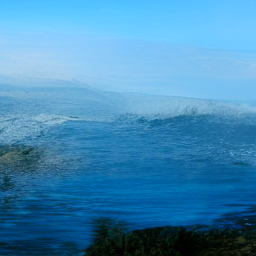

In [6]:
from utils import generate

generate(
    "a mountain and its reflection in a lake",
    transformer, tokenizer, text_encoder, vae,
    seed=42,
    num_steps=20,
    guidance_scale=7
)

100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.50it/s]


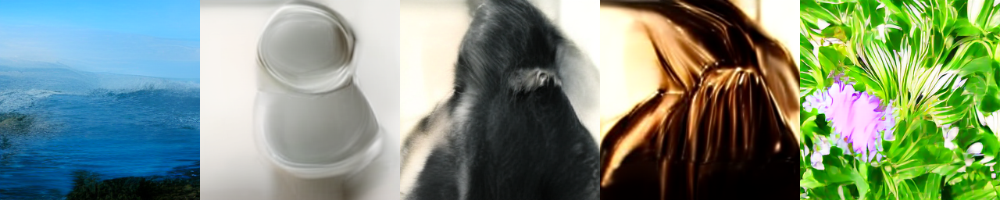

In [19]:
from utils import make_grid

prompts = ['a mountain and its reflection in a lake', 'a teapot',
          'a cat', 'a violin', 'a plant with small flowers with purple petals'
]

images = [
    generate(
        prompt,
        transformer, tokenizer, text_encoder, vae,
        seed=42,
        num_steps=20,
        guidance_scale=7
    )
    for prompt in tqdm(prompts)
]
make_grid(images, cols=8, rows=5, height=256)

## model after 10 epochs

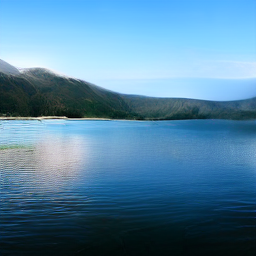

In [8]:
from utils import generate

generate(
    "a mountain and its reflection in a lake",
    transformer, tokenizer, text_encoder, vae,
    seed=42,
    num_steps=20,
    guidance_scale=7
)

100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.51it/s]


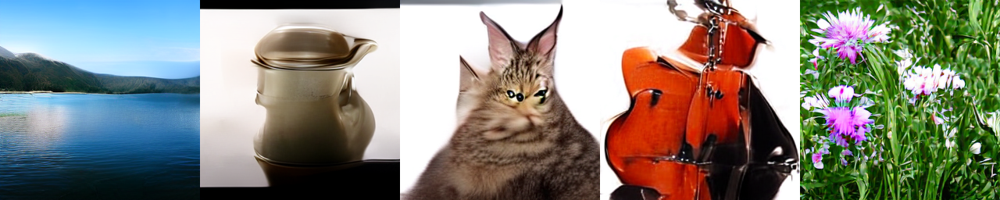

In [17]:
from utils import make_grid

prompts = ['a mountain and its reflection in a lake', 'a teapot',
          'a cat', 'a violin', 'a plant with small flowers with purple petals'
]

images = [
    generate(
        prompt,
        transformer, tokenizer, text_encoder, vae,
        seed=42,
        num_steps=20,
        guidance_scale=7
    )
    for prompt in tqdm(prompts)
]
make_grid(images, cols=8, rows=5, height=256)

## model after 50 epochs

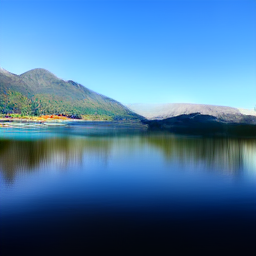

In [10]:
from utils import generate

generate(
    "a mountain and its reflection in a lake",
    transformer, tokenizer, text_encoder, vae,
    seed=42,
    num_steps=20,
    guidance_scale=7
)

100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.51it/s]


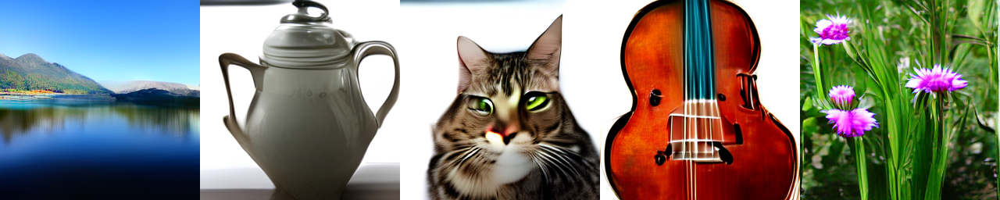

In [15]:
from utils import make_grid

prompts = ['a mountain and its reflection in a lake', 'a teapot',
          'a cat', 'a violin', 'a plant with small flowers with purple petals'
]

images = [
    generate(
        prompt,
        transformer, tokenizer, text_encoder, vae,
        seed=42,
        num_steps=20,
        guidance_scale=7
    )
    for prompt in tqdm(prompts)
]
make_grid(images, cols=8, rows=5, height=256)